# Traffic Sign Detection and Recognition

The purpose of this notebook is to motivate the approach as well as show how to train, fit and visualize the traffic sign detection and recognition technique. It contains the following:

1. [__Motivation and Implementation__](#sec:motivation)
2. [__Detection training and fitting example__](#sec:detection)
3. [__Classification training and fitting example__](#sec:classification)
4. [__Classification results with pre-trained model__](#sec:results)

## <a name="sec:motivation"></a>1. Motivation and Implementation


### 1.1 Problem Definition
Assume that there are training images for 10 different classes of traffic signs. The training images have different sizes and are almost perfectly cropped around the sign. The task is to train a model that is able to detect and classify signs on new images.

### 1.2 Approach
The solution provided by this project employs **Correlation Filters**. 

Regarding detection, given the fact that there are no negative image samples, it is impossible to use discriminative classifiers such as SVM, etc. Additionally, given the fact that the training images are cropped around the object, there is no background information to be considered as a negative sample. Also, to use classifiers such as SVM would require the collection of numerous negative examples (much more than the positive ones), which is a difficult procedure. This makes Correlation Filters ideal for the task in hand, since they do not require any negative samples. They also have very efficient training time and have proved to achieve accurate performance. 

Classification is performed simply by using a filterbank of correlation filters (one per class) and classifying each detected sign based on the filterbank's responses. Even though a more powerful multi-class one-vs-rest classification technique could be used such as multi-class SVM, LDA (note that the training samples may be too few for these), the results achieved with this approach are adequate.

### 1.3 Implementation Details
Given that all the training images are cropped around the object, the data pre-processing stage involves the following steps:
1. Resize all training images so that their smallest dimension equals to the filter size.
2. Extract randomly centered crops from the resized images. This is a _data augmentation_ step useful to slightly increase the number of training samples.

The correlation filters that are employed in this project are Minimum Output Sum of Squared Errors (MOSSE) and Multi-Channel Correlation (MCCF) filter. 

Dense features are extracted from the images and the filters are trained on the feature space. Various features were tested, such as HOG, SIFT, LBP, RGB, HSV and IGO. The features that are eventaully selected are SIFT+HSV. The signs are quite discriminative with respect to their shape (triangle vs circlular) and interior structure, thus dense SIFT are ideal fro capturing those edges. On the other hand, traffic signs can be red, white or blue, and HSV can very effectively differentiate between these colours.

The filters are trained on a single level and an image pyramid is applied on the test image. Note that the employed pyramid is not the traditional Gaussian pyramid. The user can provide any arbitrary scale values. Also, the features are not computed at each scale. On the contrary, the features are extracted once and then rescaled, which is faster without any cost on accuracy.

The multi-scale detection involves the following steps:
1. Convolve filter with rescaled image at each level.
2. Threshold the response map each time in order to find detection proposals (the bounding boxes of the proposals are transformed back to the original image space).
3. After performing 1 and 2 for all scales, perform non-maximum suppression to get the final bounding boxes.

For classification, the above procedure is repeated for all filters in the filterbank and then the class with the maximum response is selected. Note that for classification it is assumed that only one sign is visible (or at lest detectable).

Both detection and classification return a specific `Result` object that nows how to visualize itself.

**All the functions and classes of the project are fully documented.**

## <a name="sec:detection"></a>2. Detection training and fitting
Let's now train and fit a detector. First define the path to training and testing data:

In [47]:
path_to_training_data = 'dataset/train/'
path_to_testing_data = 'dataset/test/'

n_classes = 1

and import all necessary stuff:

In [48]:
%matplotlib inline
import menpo.io as mio
from menpowidgets import visualize_images
from menpo.feature import no_op
from menpo.visualize import print_progress
import matplotlib.pyplot as plt

from trafficsignrecognition import Detector, Classification, load_pretrained_model
from trafficsignrecognition.feature import fast_dsift_hsi, igo_hsi
from trafficsignrecognition.normalisation import normalise_norm_array
from trafficsignrecognition.dataaugmentation import data_augmentation

Select parameters values:

In [49]:
## TRAINING
n_augmented_images = 1    # The number of additional images to generate for each trainign sample. 
                              # The training images are augmented with random centered crops.
algorithm = 'mosse'          # 'mosse' or 'mccf'
filter_shape = (50, 50)       # A too small filter size kills the accuracy and 
                              # a too large size makes detection too slow. 
features = fast_dsift_hsi     # The features function
normalisation = no_op      # The normalization function (e.g. zero mean, unit norm)
cosine_mask = False        # Whether to apply the Hanning window on the training samples. This is in general useful
                             # but not in our case because the images are very tightly cropped.
response_covariance = 2    # The covariance of the desired Gaussian response used for learning the filter.
l = 0.01                     # Regularization parameter
boundary = 'symmetric'     # The boundary strategy when padding the image.

## FITTING
scales = 'all'             # The pyramid scale values. If 'all', then scales = np.arange(1., 0., -0.05)
diagonal = 400             # The diagonal according which the test image will be rescaled. This is equal 
                           # important with 'filter_shape' parameter and the one influences the other.
score_thresh = 0.025       # The threshold to be used for the response maps.
overlap_thresh = 0.1       # The NMS threshold.

**It is important to mention that the parameters values have not been optimized. By properly tweaking them, one can achieve much more efficient and accurate performance.** 

Let's load, pre-process and visualize the training data:

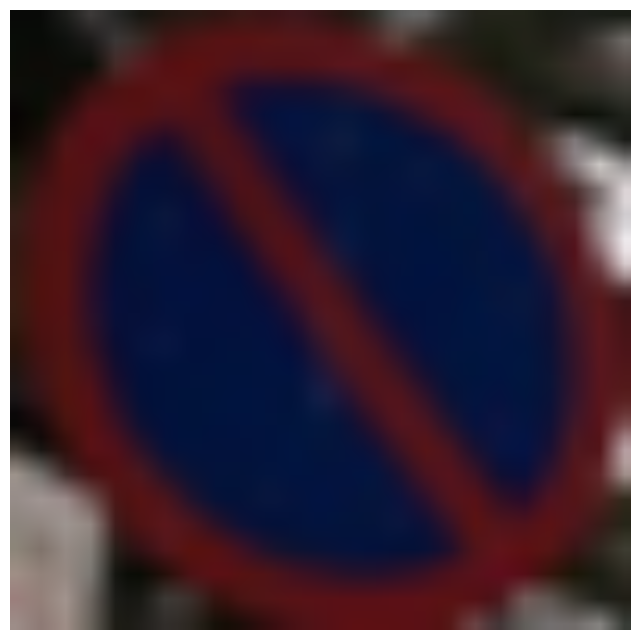

In [50]:
foldername = '0004'

# Load and pre-process each image in path (includes data augmentation)
images = []
for im in print_progress(mio.import_images(path_to_training_data + foldername), prefix='Loading ' + foldername):
    images += data_augmentation(im, crop_shape=filter_shape, n_crops=n_augmented_images)
    
# Visualize images with an interactive widget
visualize_images(images)

Let's now train the Correlation Filter detector. It only takes a few seconds.

In [51]:
detector = Detector(images, algorithm=algorithm, filter_shape=filter_shape, features=features, 
                    normalisation=normalisation, cosine_mask=cosine_mask, response_covariance=response_covariance, 
                    l=l, boundary=boundary, verbose=True)

Learning filter: [==========] 100% (242/242) - done.                            

We can print information about it as:

In [52]:
print(detector)

Correlation Filter Detector
 - Features: fast_dsift_hsi
 - Channels: 11
 Correlation Filter
 - Minimum Output Sum of Squared Errors (MOSSE)
 - Shape: 50x50
 - Response covariance: 2
 - Regularization parameter: 0.01
 - Boundary: symmetric
 - 242 training samples


and visualize the special fitler (per channel):

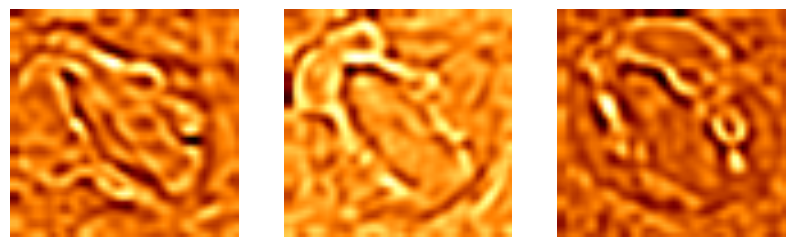

In [53]:
detector.view_spatial_filter(channels=[0, 1, 2]);

Let's now apply the detector on a test image. First load it as :

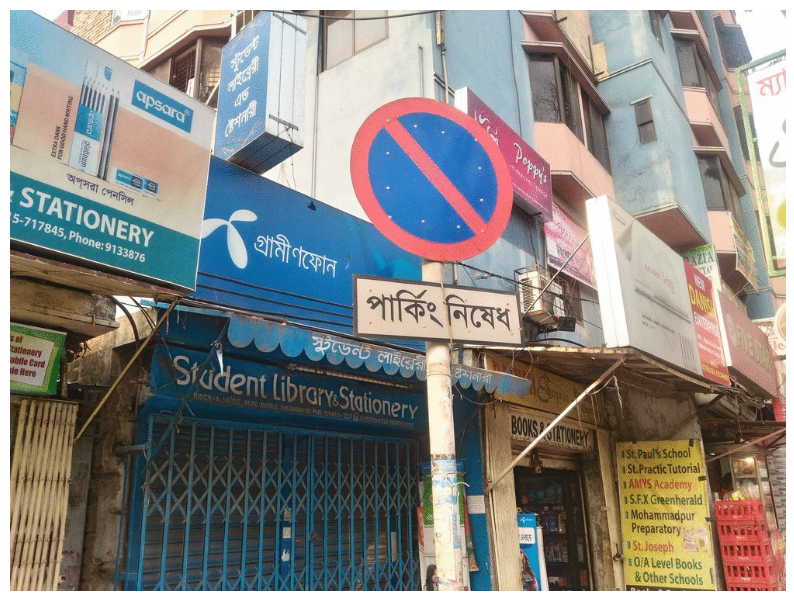

In [54]:
test_image = mio.import_image(path_to_testing_data + '19.jpg')

# Visualize it
test_image.view();

In [55]:
result = detector.detect(test_image, scales=scales, diagonal=diagonal, 
                         score_thresh=score_thresh, overlap_thresh=overlap_thresh, 
                         return_responses=True, verbose=True)

1 detection after detecting in 20 scales.                                       

The result and responses can be very easily visualized with the corresponding `view` methods. Theres is also a widget for visualizing the reponse maps per scale.

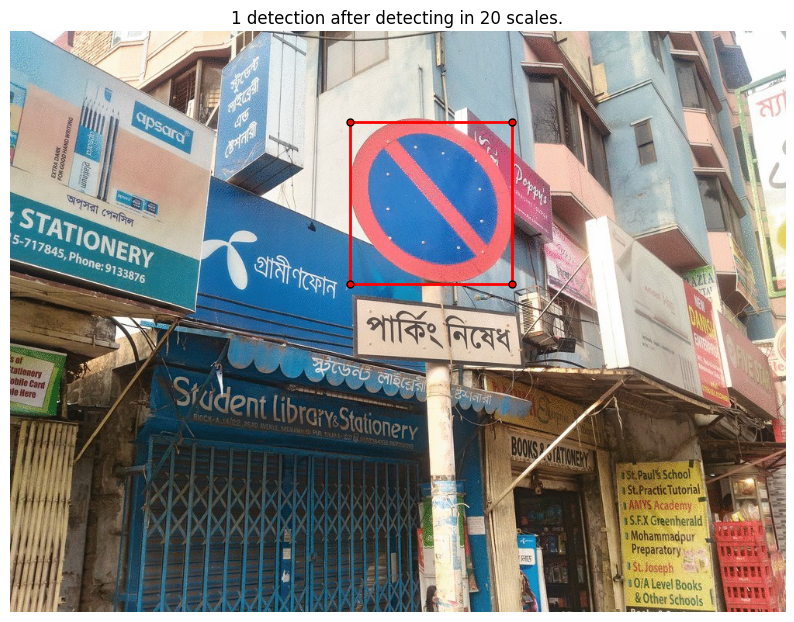

In [56]:
result.view();

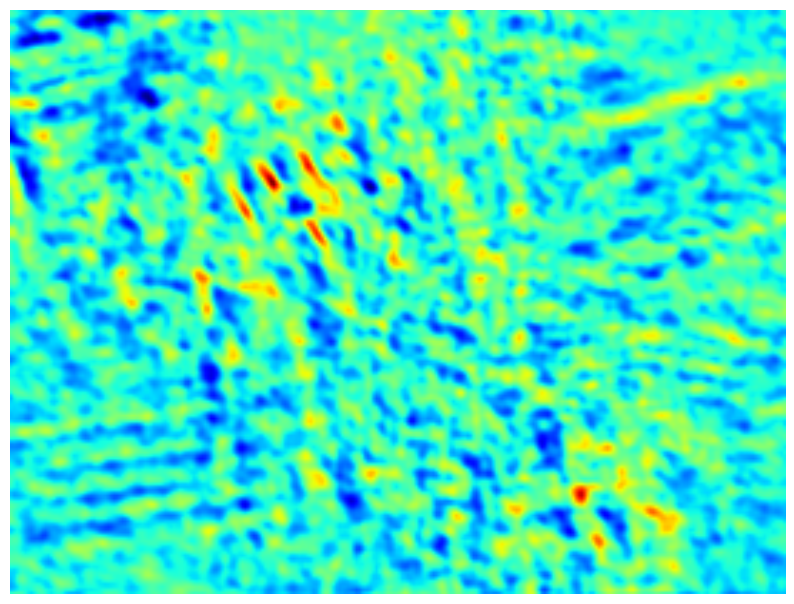

In [73]:
result.view_response(scale_id=3, cmap_name='jet');

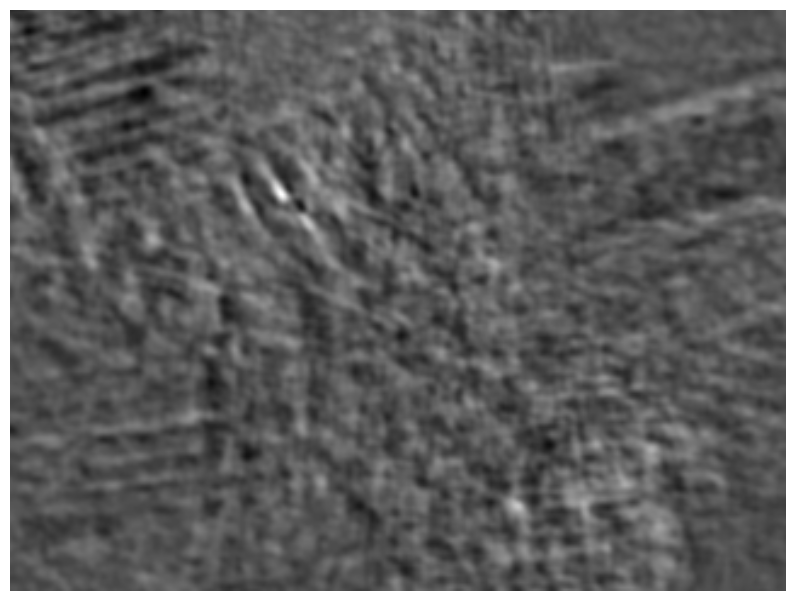

In [72]:
result.view_responses_widget()

Let's now apply the detector on an another image:

No detections.                                                                  

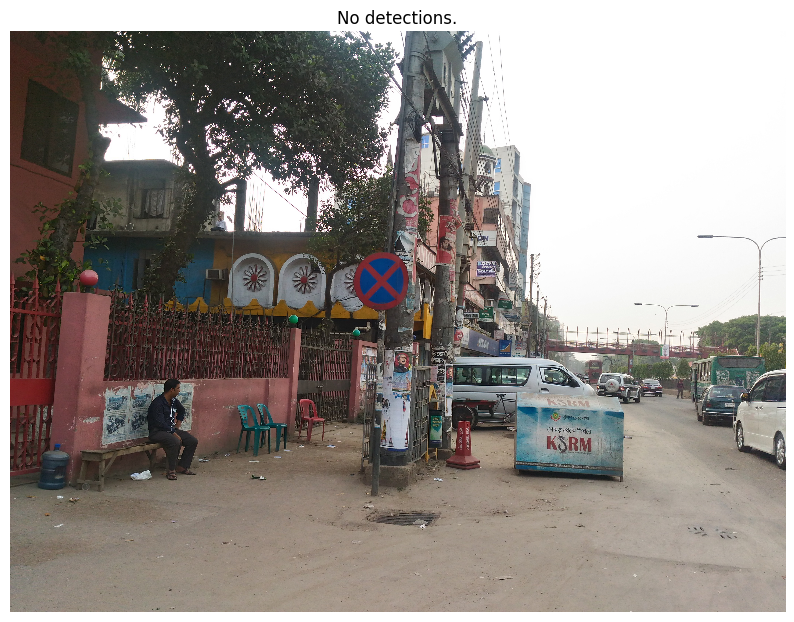

In [76]:
test_image = mio.import_image(path_to_testing_data + '22.jpg')
result = detector.detect(test_image, scales=scales, diagonal=diagonal, 
                         score_thresh=score_thresh, overlap_thresh=overlap_thresh, 
                         return_responses=True, verbose=True)
result.view();

This image is also successfully detected.

No detections.                                                                  

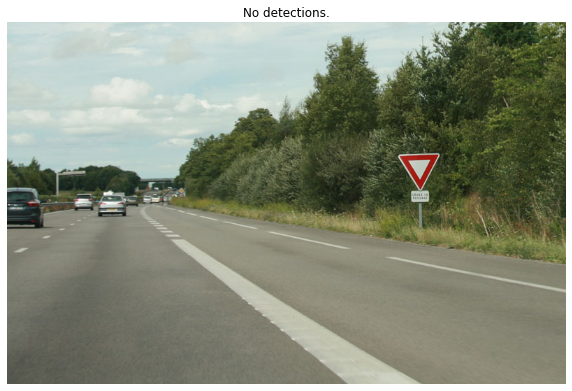

In [16]:
test_image = mio.import_image(path_to_testing_data + '02.jpg')
result = detector.detect(test_image, scales=scales, diagonal=diagonal, 
                         score_thresh=score_thresh, overlap_thresh=overlap_thresh, 
                         return_responses=True, verbose=True)
result.view();

## <a name="sec:classification"></a>3. Classification training and fitting example
Let's now train and fit a filterbank for classification. First we need to load all the images per class:

In [102]:
images = []
for f in range(n_classes):
    # Create folder name
    foldername = '{:05d}'.format(f+1)
    # Load and pre-process each image in path (includes data augmentation)
    class_images = []
    for im in print_progress(mio.import_images(path_to_training_data + foldername), 
                             prefix='Loading ' + foldername, end_with_newline=False):
        class_images += data_augmentation(im, crop_shape=filter_shape, n_crops=n_augmented_images)
    # Append to list of images
    images.append(class_images)

# Create list of labels
labels = ['bumper', '70', '50', 'school', 'no_entry', 'attention', 'no_vehicles', 
          'bicycle', 'bicycle_pedestrians', 'no_parking']

Loading 00001: [==========] 100% (110/110) - done.                              

Just to be clear, these are the labels:

IndexError: list index out of range

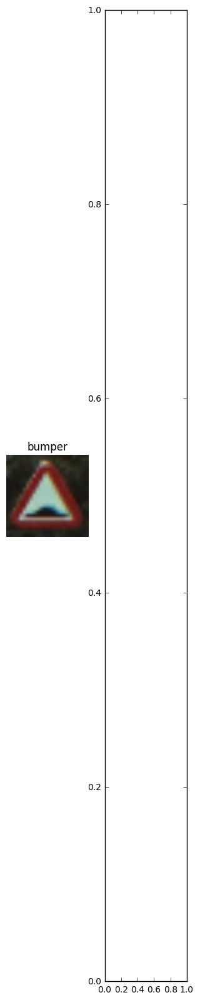

In [101]:
for i, l in enumerate(labels):
    plt.subplot(1, 10, i + 1)
    images[i][0].view(new_figure=False, figure_size=(20, 20));
    plt.title(l)

Let's train the model:

In [103]:
classifier = Classification(images, labels, algorithm=algorithm, filter_shape=filter_shape, features=features, 
                            normalisation=normalisation, cosine_mask=cosine_mask, 
                            response_covariance=response_covariance,  l=0.01, boundary=boundary, verbose=True)

ValueError: The provided images and labels have different number of classes.

In [22]:
print(classifier)

Filter-bank of Correlation Filters Classification
 - Classes: 10
   - ['bumper', '70', '50', 'school', 'no_entry', 'attention', 'no_vehicles', 'bicycle', 'bicycle_pedestrians', 'no_parking']
 - Features: fast_dsift_hsi
 Correlation Filter Detector
 - Features: fast_dsift_hsi
 - Channels: 11
 Correlation Filter
 - Minimum Output Sum of Squared Errors (MOSSE)
 - Shape: 25x25
 - Response covariance: 2
 - Regularization parameter: 0.01
 - Boundary: symmetric
 - 199 training samples


The spatial filters per class can be visualized with a widget:

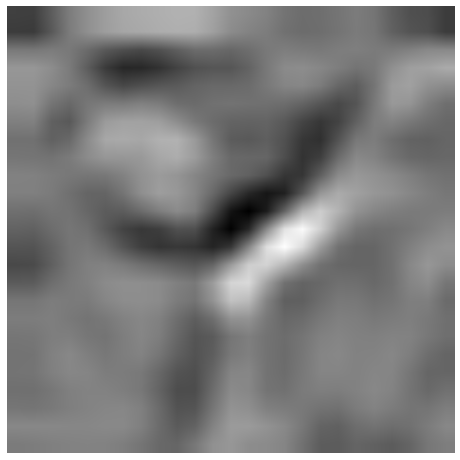

In [23]:
classifier.view_spatial_filters_widget()

Let's import a test image and fit the classifier:

In [24]:
test_image = mio.import_image(path_to_testing_data + '03.jpg')
result = classifier.fit(test_image, scales=scales, diagonal=diagonal, 
                        score_thresh=score_thresh, overlap_thresh=overlap_thresh, 
                        return_all_detections=True, verbose=True)

Detected class: '70'                                                            

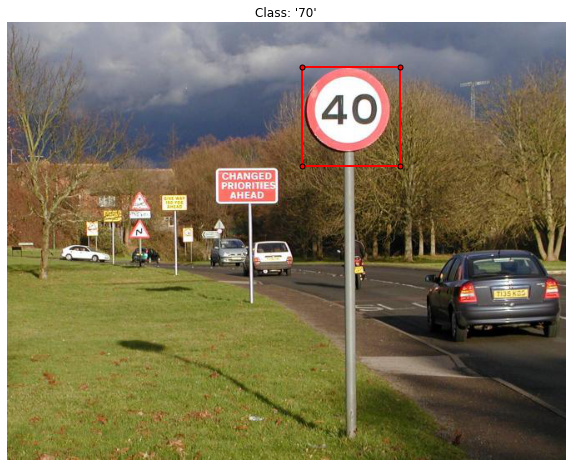

In [25]:
result.view();

All the detections returned by the filterbank can be visualized as:

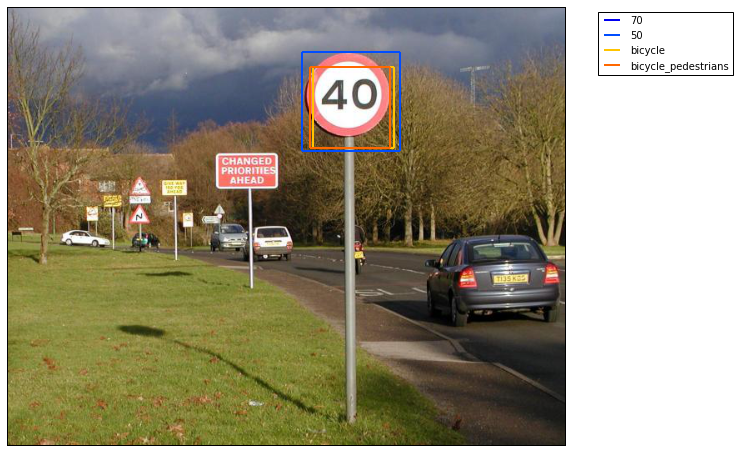

In [26]:
result.view_all_detections()

Let's now apply it a another image:

In [27]:
test_image = mio.import_image(path_to_testing_data + '05.jpg')
result = classifier.fit(test_image, scales=scales, diagonal=diagonal, 
                        score_thresh=score_thresh, overlap_thresh=overlap_thresh, 
                        return_all_detections=True, verbose=True)

Detected class: '70'                                                            

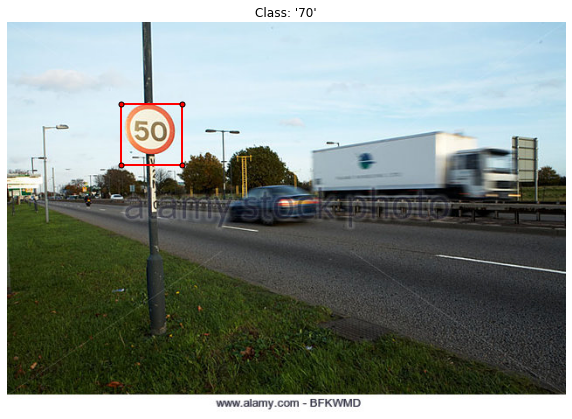

In [28]:
result.view();

The sign was classified as an 70 speed limit. However, in order to show the importance of `filter_shape` and `diagonal`, by reducing the diagonal from 400 to 370 we get:

Detected class: '50'                                                            

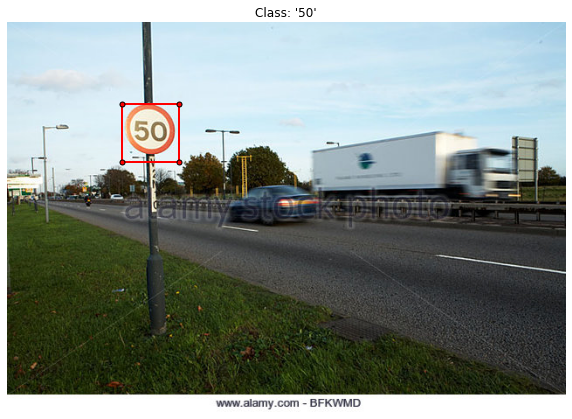

In [29]:
test_image = mio.import_image(path_to_testing_data + '05.jpg')
result = classifier.fit(test_image, scales=scales, diagonal=370, 
                        score_thresh=score_thresh, overlap_thresh=overlap_thresh, 
                        return_all_detections=True, verbose=True)
result.view();

Remember that the classification label can be retrieved as:

In [30]:
result.classname

'50'

or

In [105]:
print(result)

No detections.


## <a name="sec:results"></a>4. Classification results with pre-trained model
Let's now load a pre-trained model:

In [104]:
classifier = load_pretrained_model()

print(classifier)

Filter-bank of Correlation Filters Classification
 - Classes: 10
   - ['bumper', '70', '50', 'school', 'no_entry', 'attention', 'no_vehicles', 'bicycle', 'bicycle_pedestrians', 'no_parking']
 - Features: fast_dsift_hsi
 Correlation Filter Detector
 - Features: fast_dsift_hsi
 - Channels: 11
 Correlation Filter
 - Minimum Output Sum of Squared Errors (MOSSE)
 - Shape: 25x25
 - Response covariance: 2
 - Regularization parameter: 0.01
 - Boundary: symmetric
 - 199 training samples


and fit it on all the testing images:

In [33]:
test_images = list(mio.import_images(path_to_testing_data, verbose=True))
results = [classifier.fit(im, verbose=False) for im in print_progress(test_images)]

Found 8 assets, index the returned LazyList to import.
[====================] 100% (8/8) - done.                                       


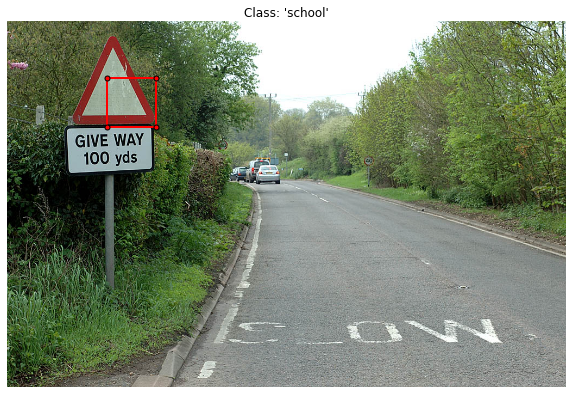

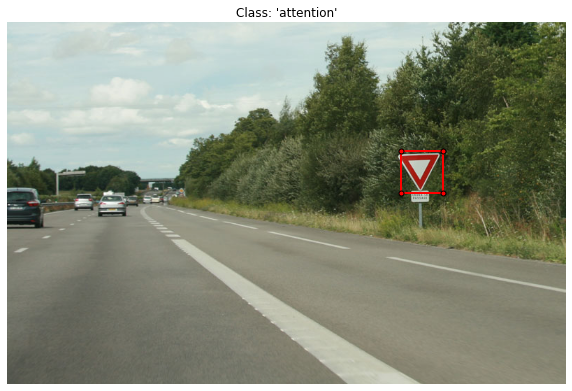

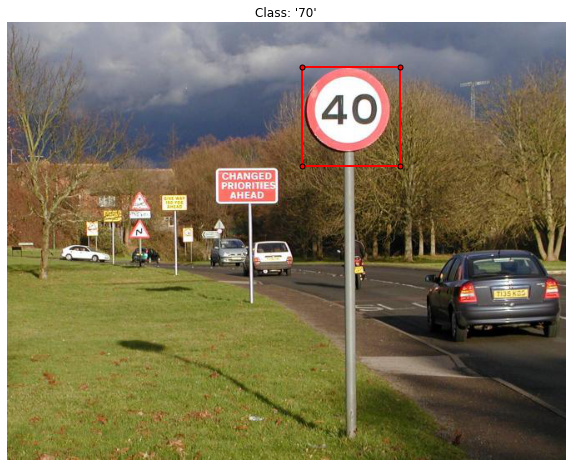

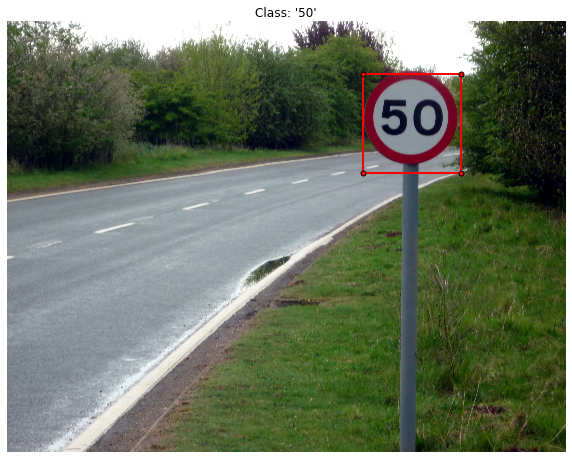

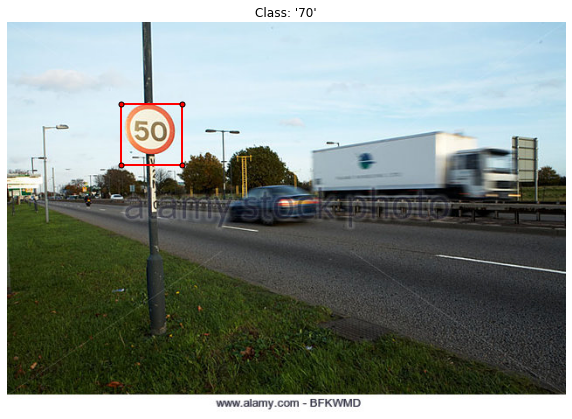

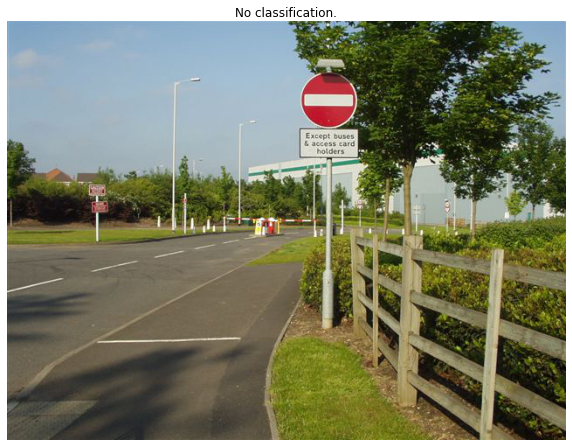

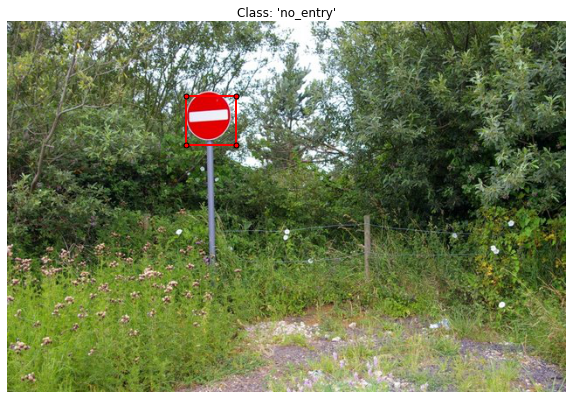

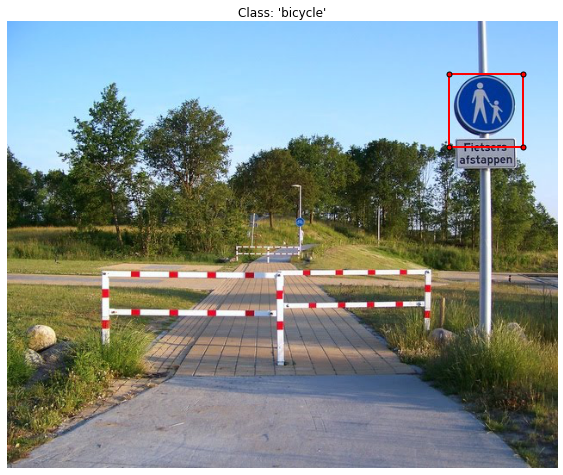

In [34]:
for i, r in enumerate(results):
    r.view(new_figure=True);

As mentioned before, note that the result could be greatly improved by optimizing the parameters.